
# 🧪 Lab 3 — **Diffusion Models**: Stable Diffusion Generation & Editing

**Course:** Generative AI (Day 3)  
**Lab Length:** ~3 hours

**Goal:** Use a pre-trained **Stable Diffusion** model to (1) generate images from text, (2) perform **inpainting**/**prompt-to-edit**, and (3) (optional) compute **CLIP** text–image alignment scores.

> ✅ **Deliverables (submit this notebook):**
> - A mini **gallery** of your best generations (≥ 6 images across 3 prompts)
> - An **editing** (inpainting) before/after example
> - A table of **CLIP similarity** scores for 3 prompts
> - A short **reflection** on prompt engineering and limitations

### 🚦 Guidelines
- Keep `num_inference_steps` small at first (10–25) to save time.
- If VRAM is tight, try `stabilityai/sd-turbo` for very fast results (few steps).
- Cells marked **(Provided)** can be run as-is; cells marked **(TODO)** require your edits.



## 🎯 Learning Objectives
- Understand the **inference knobs** of diffusion (steps, guidance scale, seed).
- Generate images from text with **StableDiffusionPipeline**.
- Perform **inpainting** / region editing with a mask.
- Evaluate prompt–image alignment with **CLIP similarity** (optional).
- Document prompt engineering insights in a concise report.


In [ ]:

# ===== (Provided) Setup & Installs =====
# If you're in Colab, uncomment to install pinned versions:
!pip install -q --upgrade diffusers==0.29.0 transformers==4.41.2 peft==0.10.0 accelerate safetensors


import torch, random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
from IPython.display import display

from diffusers import StableDiffusionPipeline, StableDiffusionInpaintPipeline
from transformers import CLIPProcessor, CLIPModel

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)
torch.manual_seed(42); np.random.seed(42); random.seed(42)


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.8/43.8 kB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 34.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.1/9.1 MB 87.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.1/199.1 kB 17.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 32.2 MB/s eta 0:00:00


The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

Device: cuda


/usr/local/lib/python3.12/dist-packages/diffusers/models/transformers/transformer_2d.py:34: FutureWarning: `Transformer2DModelOutput` is deprecated and will be removed in version 1.0.0. Importing `Transformer2DModelOutput` from `diffusers.models.transformer_2d` is deprecated and this will be removed in a future version. Please use `from diffusers.models.modeling_outputs import Transformer2DModelOutput`, instead.
  deprecate("Transformer2DModelOutput", "1.0.0", deprecation_message)



---

## Part 1 — First Image from Text

**Tasks:**
1) Load a Stable Diffusion model (choose one):
   - `stabilityai/stable-diffusion-2-1-base` (balanced quality)
   - `runwayml/stable-diffusion-v1-5` (popular v1.5)
   - `stabilityai/sd-turbo` (very fast, uses few steps)
2) Generate your **first image** from a descriptive prompt.
3) Save or display the image.

> 💡 **Hints**
> - Use `torch_dtype=torch.float16` on GPU for speed/memory.
> - Typical ranges: `num_inference_steps=20–30`, `guidance_scale=5–9` (turbo models often use 1–4 steps and may ignore guidance).


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 174.7/174.7 kB 6.7 MB/s eta 0:00:00


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

safety_checker/model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

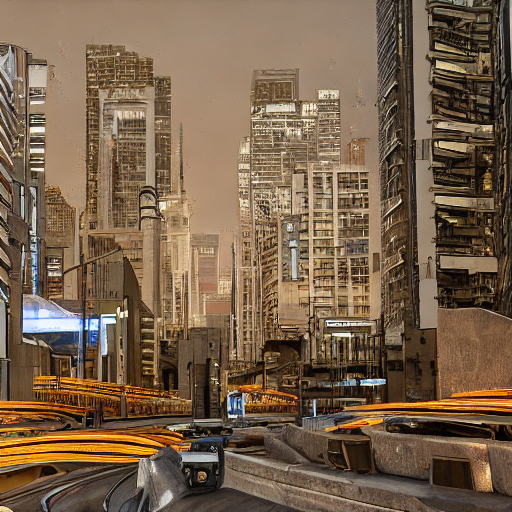

In [ ]:
from diffusers import StableDiffusionPipeline
import torch

# Downgrade peft to a known compatible version to resolve ImportError
!pip install -q peft==0.6.2

model_id = "runwayml/stable-diffusion-v1-5"
device = "cuda" if torch.cuda.is_available() else "cpu"
dtype = torch.float16 if device == "cuda" else torch.float32

pipe = StableDiffusionPipeline.from_pretrained(
    model_id,
    torch_dtype=dtype
).to(device)

prompt = "a cyberpunk city skyline at sunset, cinematic lighting, ultra-detailed"
image = pipe(prompt, num_inference_steps=25, guidance_scale=0.0).images[0]
image


---

## Part 2 — Prompt Engineering Experiments

**Experiment matrix** (edit as you like):
- Prompts: at least **3** diverse descriptions (e.g., realistic photo, watercolor painting, sci‑fi scene)
- Guidance scales: e.g., **[5, 7.5, 12]**
- Steps: start with **25**, then try **10** or **30** for comparison

**What to observe:**
- Lower guidance → more creative, less literal
- Higher guidance → more literal, sometimes over-sharpened or artifacty
- Steps ↑ → potentially cleaner but slower

> 💡 **Hints**
> - Fix a **seed** to compare apples-to-apples across settings.
> - Record your results in a small table (prompt, scale, steps, notes).


  0%|          | 0/15 [00:00<?, ?it/s]

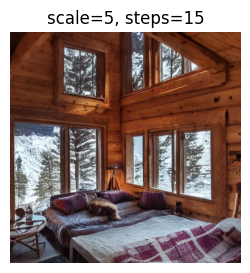

  0%|          | 0/10 [00:00<?, ?it/s]

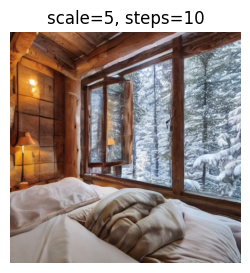

  0%|          | 0/15 [00:00<?, ?it/s]

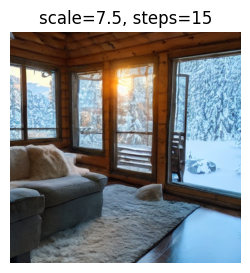

  0%|          | 0/10 [00:00<?, ?it/s]

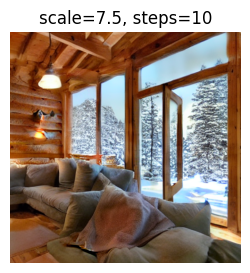

  0%|          | 0/15 [00:00<?, ?it/s]

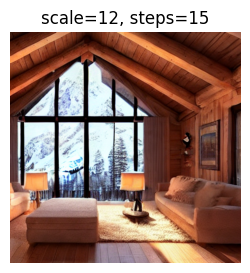

  0%|          | 0/10 [00:00<?, ?it/s]

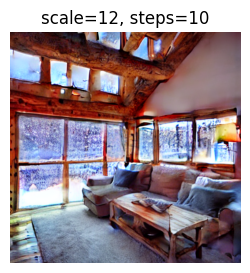

  0%|          | 0/15 [00:00<?, ?it/s]

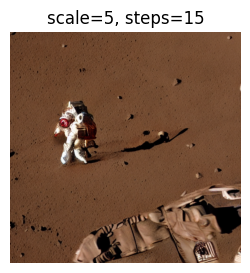

  0%|          | 0/10 [00:00<?, ?it/s]

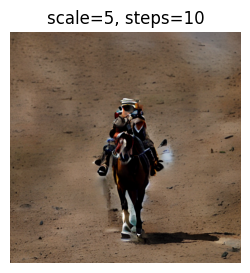

  0%|          | 0/15 [00:00<?, ?it/s]

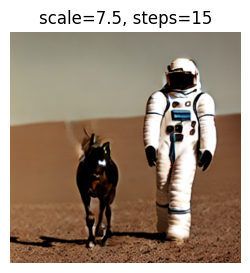

  0%|          | 0/10 [00:00<?, ?it/s]

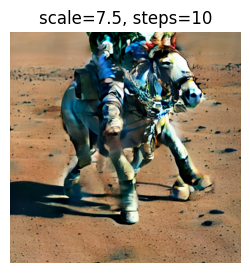

  0%|          | 0/15 [00:00<?, ?it/s]

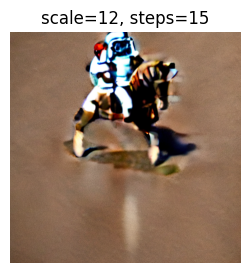

  0%|          | 0/10 [00:00<?, ?it/s]

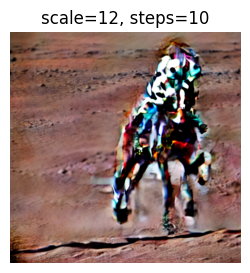

  0%|          | 0/15 [00:00<?, ?it/s]

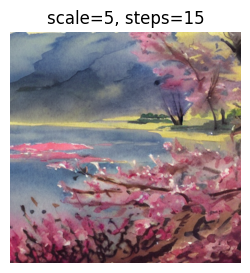

  0%|          | 0/10 [00:00<?, ?it/s]

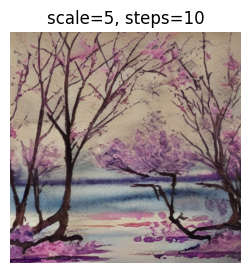

  0%|          | 0/15 [00:00<?, ?it/s]

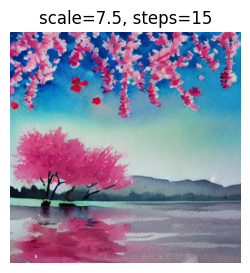

  0%|          | 0/10 [00:00<?, ?it/s]

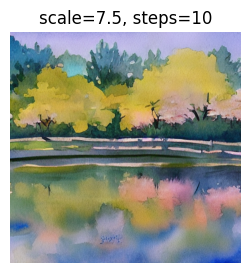

  0%|          | 0/15 [00:00<?, ?it/s]

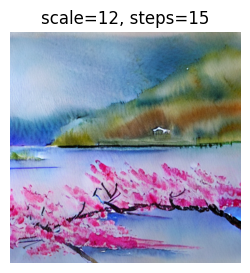

  0%|          | 0/10 [00:00<?, ?it/s]

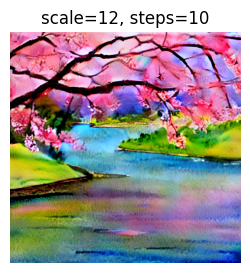

In [ ]:

# ===== (TODO) Systematic prompt experiments =====
torch.manual_seed(123)  # set a seed for reproducibility (optional)

prompts = [
    "a cozy cabin in the snowy mountains, warm lights inside, volumetric lighting",
    "an astronaut riding a horse on mars, 35mm photo, shallow depth of field",
    "a watercolor painting of cherry blossoms by a lake, soft brush strokes"
]

cfg_scales = [5, 7.5, 12]
steps_list = [15, 10]

def show(img, title=None):
    plt.figure(figsize=(3,3)); plt.imshow(img); plt.axis("off")
    if title is not None:
        plt.title(title)
    plt.show()

for p in prompts:
    for s in cfg_scales:
        for st in steps_list:
            out = pipe(p, num_inference_steps=st, guidance_scale=s).images[0]
            show(out, title=f"scale={s}, steps={st}")



---

## Part 3 — Image Editing (Inpainting)

**Tasks:**
1) Generate or load a base image.
2) Create a **mask** (white = edit region, black = keep).
3) Use `StableDiffusionInpaintPipeline` with a new prompt to modify the masked region.

> 💡 **Hints**
> - To draw a quick mask: use `Image.new("L", size, 0)` then draw white shapes with `ImageDraw.Draw(mask)`.
> - Try multiple edits: add/remove an object, change style, replace backgrounds.


  0%|          | 0/25 [00:00<?, ?it/s]

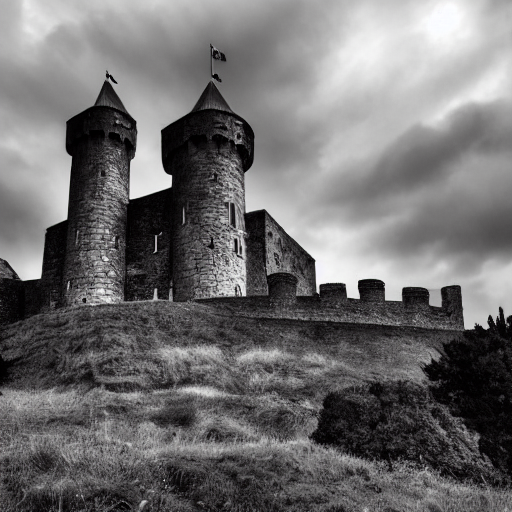

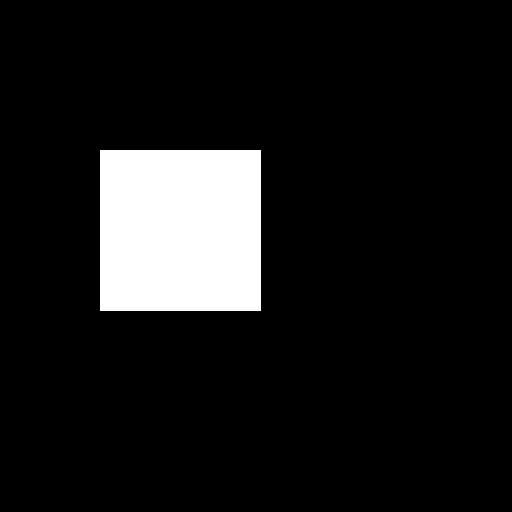

model_index.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

safety_checker/model.safetensors not found


Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/748 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/313 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

safety_checker/pytorch_model.bin:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

text_encoder/pytorch_model.bin:   0%|          | 0.00/492M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/552 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.bin:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.bin:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


  0%|          | 0/25 [00:00<?, ?it/s]

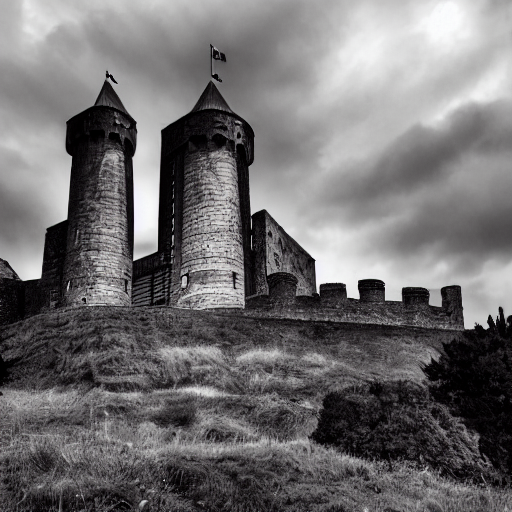

In [ ]:

# ===== (TODO) Inpainting: create base image + mask, then edit =====

# 1) Base image
base = pipe("a photo of a medieval castle on a hill, dramatic clouds", num_inference_steps=25, guidance_scale=7.5).images[0]
display(base)

# 2) Create a mask (white region will be edited)
mask = Image.new("L", base.size, 0)
draw = ImageDraw.Draw(mask)
# TODO: adjust rectangle or draw shapes where you want the edit
draw.rectangle([100, 150, 260, 310], fill=255)
display(mask)

# 3) Inpaint with a new prompt
inpaint_pipe = StableDiffusionInpaintPipeline.from_pretrained(
    "runwayml/stable-diffusion-inpainting",
    torch_dtype=torch.float16 if torch.cuda.is_available() else torch.float32
).to(device)

edit_prompt = "replace with a modern glass skyscraper, realistic photo, matching lighting"  # TODO: edit
edited = inpaint_pipe(
    prompt=edit_prompt,
    image=base,
    mask_image=mask,
    num_inference_steps=25,
    guidance_scale=8.0
).images[0]

display(edited)



---

## Part 4 — CLIP Text–Image Alignment

Compute a **cosine similarity** between text and image embeddings using **CLIP**.

> 💡 **Hints**
> - Use `openai/clip-vit-base-patch32` via `transformers`.
> - Higher cosine similarity → stronger alignment (rough proxy, not perfect).


In [ ]:

# ===== (Optional TODO) CLIP similarity scoring =====
# If CLIP model isn't available or too slow, you can skip this section.

clip_model_id = "openai/clip-vit-base-patch32"
clip_model = CLIPModel.from_pretrained(clip_model_id).to(device)
clip_proc = CLIPProcessor.from_pretrained(clip_model_id)

def clip_similarity(text, pil_image):
    inputs = clip_proc(text=[text], images=[pil_image], return_tensors="pt", padding=True).to(device)
    with torch.no_grad():
        out = clip_model(**inputs)
        score = torch.cosine_similarity(out.text_embeds, out.image_embeds)
    return float(score.item())

# Example: compute scores for a few prompt/image pairs
scores = []
for p in prompts:
    img = pipe(p, num_inference_steps=20, guidance_scale=7.5).images[0]
    s = clip_similarity(p, img)
    scores.append((p, s))
    print(f"Prompt: {p}\nCLIP similarity: {s:.3f}\n")


config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Prompt: a cozy cabin in the snowy mountains, warm lights inside, volumetric lighting
CLIP similarity: 0.317



  0%|          | 0/20 [00:00<?, ?it/s]

Prompt: an astronaut riding a horse on mars, 35mm photo, shallow depth of field
CLIP similarity: 0.347



  0%|          | 0/20 [00:00<?, ?it/s]

Prompt: a watercolor painting of cherry blossoms by a lake, soft brush strokes
CLIP similarity: 0.362




---

## Part 5 — Mini Gallery

Select your **best** images (≥ 6 across 3 prompts).  
Display them with captions: Prompt + key settings (guidance, steps).


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

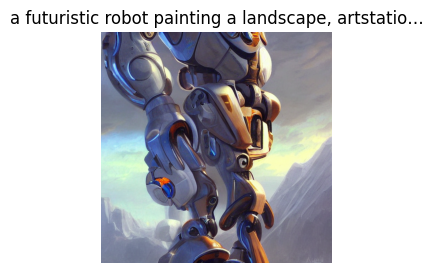

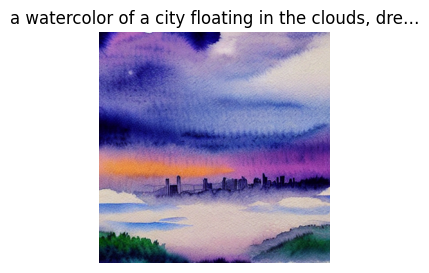

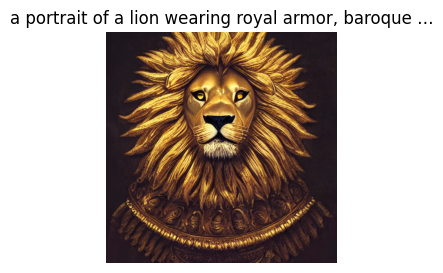

In [ ]:

# ===== (TODO) Mini gallery =====
gallery_prompts = [
    "a futuristic robot painting a landscape, artstation trending, highly detailed",
    "a watercolor of a city floating in the clouds, dreamy, soft colors",
    "a portrait of a lion wearing royal armor, baroque style, dramatic lighting"
]

best = []
for p in gallery_prompts:
    img = pipe(p, num_inference_steps=25, guidance_scale=8.0).images[0]
    best.append((p, img))

for p, img in best:
    plt.figure(figsize=(3,3)); plt.imshow(img); plt.axis("off"); plt.title(p[:50] + '…'); plt.show()


---

# Part 6 — The "Stress Test"

**Context:**
In the previous sections, you used the default settings. But Stable Diffusion is modular. The "Brain" (U-Net) is separate from the "Solver" (Scheduler).
1.  **The Scheduler:** Determines *how* the noise is subtracted. Some are fast (Euler), some are detailed (DDIM), some are creative (Ancestral).
2.  **The Breakpoint:** You used Guidance Scale ~7.5. What happens at 25? Does the image get better, or does it "burn"?

**Your Task:**
Run the **Scheduler vs. Scale** ablation loop below.
You will test 3 distinct schedulers across a spectrum of Guidance Scales (from 2.0 to 20.0).

**Deliverables:**
1.  Run the code block (this will generate ~15-20 images).
2.  Fill the **Observation Table** below based on the visual results.



Starting Stress Test... (This involves loading different solvers and generating many images)

--- Testing Scheduler: EulerAncestral ---


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

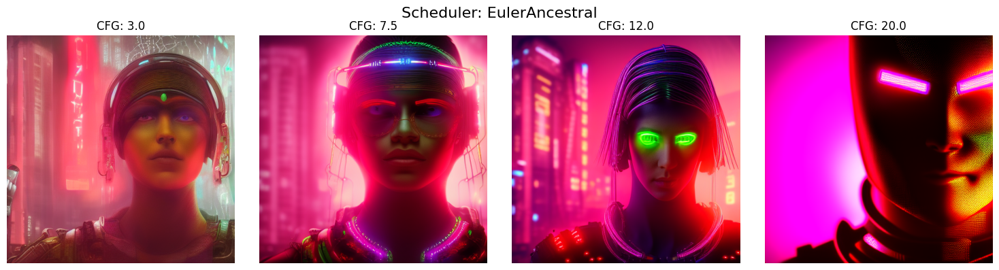


--- Testing Scheduler: DDIM ---


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

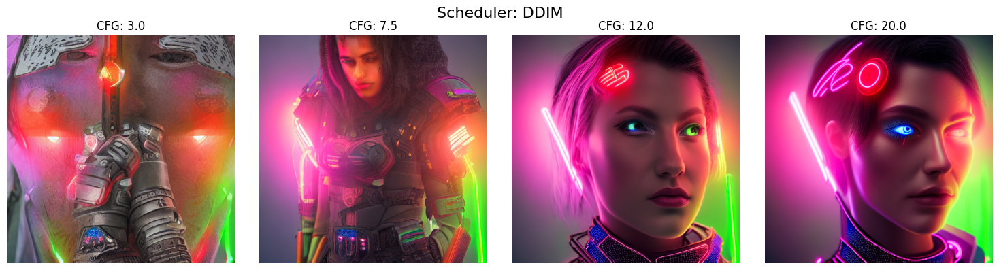


--- Testing Scheduler: PNDM_Default ---


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

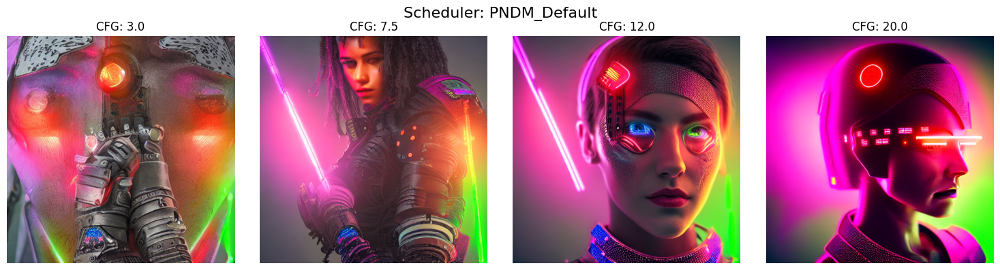

Test Complete. Analyze the images above for the table.


In [ ]:
# ===== (TODO) The Scheduler & Guidance Stress Test =====
from diffusers import EulerAncestralDiscreteScheduler, DDIMScheduler, PNDMScheduler

# 1. Define a complex prompt (easier to see artifacts on faces/details)
test_prompt = "detailed portrait of a cyberpunk warrior with neon armor, intricate circuitry, 8k resolution, cinematic lighting"
seed = 999  # Fixed seed is CRITICAL for comparison

# 2. Define the variables
scales_to_test = [3.0, 7.5, 12.0, 20.0] # From low to "deep fried"
schedulers = {
    "EulerAncestral": EulerAncestralDiscreteScheduler.from_config(pipe.scheduler.config),
    "DDIM": DDIMScheduler.from_config(pipe.scheduler.config),
    "PNDM_Default": PNDMScheduler.from_config(pipe.scheduler.config)
}

# 3. The Heavy Loop
import matplotlib.pyplot as plt

print("Starting Stress Test... (This involves loading different solvers and generating many images)")

for sched_name, sched_obj in schedulers.items():
    print(f"\n--- Testing Scheduler: {sched_name} ---")

    # Swap the scheduler in the pipeline
    pipe.scheduler = sched_obj

    # Create a row of images for this scheduler
    cols = len(scales_to_test)
    fig, axes = plt.subplots(1, cols, figsize=(15, 4))
    fig.suptitle(f"Scheduler: {sched_name}", fontsize=16)

    for i, scale in enumerate(scales_to_test):
        # Generate
        # We use a fixed generator seed for perfect scientific comparison
        generator = torch.Generator(device=device).manual_seed(seed)
        image = pipe(
            test_prompt,
            num_inference_steps=30,
            guidance_scale=scale,
            generator=generator
        ).images[0]

        # Display
        axes[i].imshow(image)
        axes[i].set_title(f"CFG: {scale}")
        axes[i].axis("off")

    plt.tight_layout()
    plt.show()

print("Test Complete. Analyze the images above for the table.")

---
# Part 7 — Research Challenge: The "Pink Elephant" Paradox

**Context:**
If I tell you *"Don't think of a pink elephant,"* you immediately think of one. Stable Diffusion often has the same problem.
The text encoder (CLIP) uses an "Attention" mechanism that focuses heavily on nouns like "Elephant" or "Apples," but it often fails to understand grammatical negation words like "not," "without," or "no."

**The Experiment:**
1. Run the code below. You will attempt to generate a "fruit bowl **without** apples" using only the main prompt.
2. You will likely see apples (The Failure).
3. You will then use the `negative_prompt` argument to fix it.

**The Research Task (Crucial):**
This is not just about running code. You must **search online** to answer the analysis question below. You need to explain *mathematically* how a negative prompt actually works.

### 1. Run the Experiment

Generating Case A (The Trap)...


  0%|          | 0/30 [00:00<?, ?it/s]

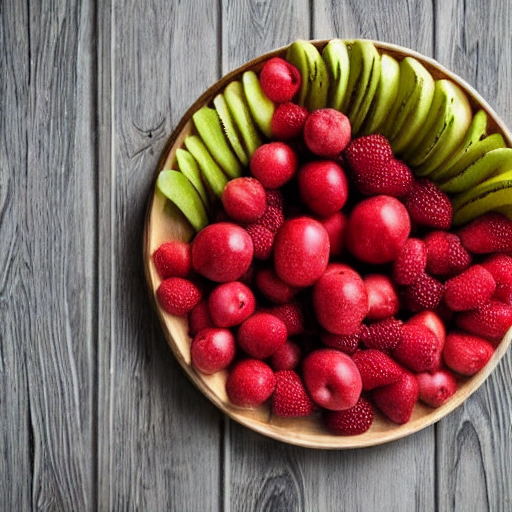

Generating Case B (The Solution)...


  0%|          | 0/30 [00:00<?, ?it/s]

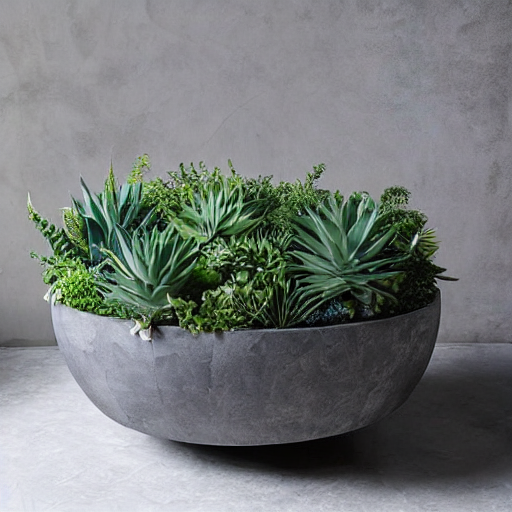

In [ ]:
# ===== (TODO) The Negation Experiment =====

# Case A: The Failure
# We ask the model NOT to include something using natural language.
# The model usually fails because CLIP pays attention to the token "apples".
prompt_fail = "a beautiful fruit bowl on a table, high quality, but with no apples or red fruit"
print("Generating Case A (The Trap)...")
image_fail = pipe(prompt_fail, num_inference_steps=30, guidance_scale=7.5).images[0]
display(image_fail)

# Case B: The Fix (Negative Prompting)
# We move the forbidden concepts into the negative_prompt argument.
prompt_clean = "a beautiful fruit bowl on a table, high quality"
neg_prompt = "apples, red fruit"

print("Generating Case B (The Solution)...")
image_success = pipe(
    prompt_clean,
    negative_prompt=neg_prompt,
    num_inference_steps=30,
    guidance_scale=7.5
).images[0]
display(image_success)

### 2. 🕵️‍♀️ Research Report (Required)

**A. Visual Observation:**
Did the model generate apples in Case A even though you explicitly wrote "no apples"? Why do you think the AI failed to understand the word "no"?

**B. The Math of Negative Prompts (Search Online):**
Search for *"Classifier Free Guidance formula negative prompt"* or *"How does Stable Diffusion negative prompt work math"*.

*   **Question:** A negative prompt is **NOT** a post-processing filter (it doesn't just delete apples after they are drawn). Explain what is happening to the **Noise Vectors**.
*   **Hint:** The standard formula is: $\text{Noise} = \text{Uncond} + s \times (\text{Cond} - \text{Uncond})$.
    *   When you add a negative prompt, what replaces the "Uncond" (Unconditional) part?
    *   Does the model "move towards" the negative prompt or "push away" from it?

**Your Answer:**
...


---

## 📝 Final Reflection (fill before submission)

**Prompt Experiments**
| Prompt | Guidance | Steps | Notes |
|---|---:|---:|---|
| … | … | … | … |
| … | … | … | … |

**Inpainting**
- Insert before/after images above. Explain what you changed.

**(Optional) CLIP**
| Prompt | Similarity |
|---|---:|
| … | … |
| … | … |

### 📝 Observation Table

| Scheduler | Best Guidance Scale | What happens at Scale 20? (Describe artifacts) | "Vibe" check (Soft vs Sharp) |
| :--- | :--- | :--- | :--- |
| **EulerAncestral** | ... | ... | ... |
| **DDIM** | ... | ... | ... |
| **PNDM (Default)** | ... | ... | ... |

### 🧠 Analysis
*   **The "Deep Fry" Effect:** At high guidance (e.g., >15), colors often become neon/oversaturated and shapes become jagged. Why does forcing the model to adhere strictly to the prompt cause this visual noise?
*   **Sampler Preference:** Which scheduler produced the most realistic human skin texture? Which one felt more "painterly"?

**Insights**
- Guidance vs creativity: …  
- Steps vs speed/quality: …  
- Editing best practices: …  
- Major failure cases & ideas to fix them: …  
